In [1]:
%matplotlib inline
import os
import json
import pandas as pd
import numpy as np
import math
import folium
import altair as alt
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore
from sklearn.decomposition import PCA
from sklearn import cluster
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
from sklearn.decomposition import TruncatedSVD
import os
from folium import IFrame
from numpy import linalg
import scipy
import branca.colormap as cm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
!pip install statsmodels
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np
import itertools
# import altair_viewer
from PIL import Image
!-m pip install --upgrade pip
!pip install pmdarima
!pip install wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
!pip install xlrd

world_geo = r"world.json" # geojson file

# enable correct rendering
# alt.renderers.enable('default') # arwhyte
# uses intermediate json files to speed things up
# alt.data_transformers.enable('json') # arwhyte


You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
/bin/bash: - : invalid option
Usage:	/bin/bash [GNU long option] [option] ...
	/bin/bash [GNU long option] [option] script-file ...
GNU long options:
	--debug
	--debugger
	--dump-po-strings
	--dump-strings
	--help
	--init-file
	--login
	--noediting
	--noprofile
	--norc
	--posix
	--pretty-print
	--rcfile
	--restricted
	--verbose
	--version
Shell options:
	-ilrsD or -c command or -O shopt_option		(invocation only)
	-abefhkmnptuvxBCHP or -o option
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [2]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from matplotlib.pylab import rcParams
from pmdarima import auto_arima
from statsmodels.tsa.arima_model import ARIMA,ARIMAResults,ARMA,ARMAResults
from sklearn.metrics import mean_squared_error

In [3]:
#Importing Main Dataset and Secondary Datasets
!pip install openpyxl
%run M1_loaddata

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [4]:
#Grouping sales by customers
customer_df = clean_df.groupby(by=['Customer ID']).agg({'Quantity':['min', 'max', 'sum'], 'Price':['min', 'max', 'sum']})
print("Number of unique customers = ", customer_df.index.size)

Number of unique customers =  5853


In [5]:
# Function to get all the country related information for the analysis task
def countrydf(name, frequency="M"):
    # Country specific local dataframe
    cdf = clean_df.loc[clean_df["Country"] == name]
    # Datetime conversion
    cdf["date"] = pd.to_datetime(cdf.InvoiceDate)
    
    # Now lets find cummulative Sales for plot
    # First lets group by Date to get transaction total per day
    plotdf = cdf.set_index("date").resample(frequency)['SalesValue'].sum()
    
    # Convert series to dataframe
    plotdf = plotdf.reset_index()
    # Change date format from YYYY-MM-DD to YYYY-MM
    plotdf["date"] = plotdf["date"].dt.strftime("%Y-%m")
    # Set date as index
    plotdf = plotdf.set_index("date")
    
    # Total sales for the country
    sales = plotdf["SalesValue"].sum()
    # DF that conforms to 13 row format if frequency is set to monthly
    if frequency == "M":
        plotdf = (plotdf + dummydf).fillna(0)
    # Number of unique customers in the country
    custcnt = len(cdf["Customer ID"].unique())
    # Numpy array of unique stock sold in each country
    uniquestock = cdf["StockCode"].unique() #add .tolist() if list output is desired
    #Country code
    code = valeurs(name)
    #GDP, CPI,  for year 2011
    gdp = gdp_df.loc[gdp_df["Country Code"] == code, "2011"].item()
    cpi = cpi_df.loc[cpi_df["Country Code"] == code, "2011"].item()
    #exchrate = exchrate_df.loc[exchrate_df["Country Code"] == code, "2011"].item()
    pop = pop_df.loc[pop_df["Country Code"] == code, "2011"].item()
    merch = merch_df.loc[merch_df["Country Code"] == code, "2011"].item()
    internet = internet_df.loc[internet_df["Country Code"] == code, "2011"].item()
    #Sea Distance
    dist = seadist_df.loc[seadist_df["iso2"]==code, "seadistance"].item()
    #Country region
    region = prop_df.loc[pop_df["Country Code"] == code, "Region"].item()
    #Country region
    incgrp = prop_df.loc[pop_df["Country Code"] == code, "IncomeGroup"].item()
    #Life expectancy
    life_expect=lifeExpect_df.loc[internet_df["Country Code"] == code, "2011"].item()
    #Expenditure on health
    expend_health = expendHealth_df.loc[internet_df["Country Code"] == code, "2011"].item()
    #PPP per capita
    ppp_capita = PPP_per_capita_df.loc[internet_df["Country Code"] == code, "2011"].item()
    
    return {'name':name, 'code':code, 'region': region, 'income group': incgrp, 'df':plotdf, 
            'totalsales':sales, 'customercnt':custcnt, 'uniqueStockID': uniquestock, 
            'gdp':gdp, 'cpi':cpi, 'population':pop, 'merchsales': merch, 'internet':internet, 
            'distance':dist, 'expend_health':expend_health,'ppp_cap':ppp_capita,
            'life_expect':life_expect }


# Creating dummydf to obtain fixed 25 row msales_df i.e. Monthly sales Dataframe
dummyindex = ['2009-12', '2010-01', '2010-02', '2010-03', '2010-04', '2010-05',
              '2010-06', '2010-07', '2010-08', '2010-09', '2010-10', '2010-11',
              '2010-12', '2011-01', '2011-02', '2011-03', '2011-04', '2011-05',
              '2011-06', '2011-07', '2011-08', '2011-09', '2011-10', '2011-11',
              '2011-12']
dummyvalues = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
               0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
dummydf = pd.DataFrame({'date':dummyindex, 'SalesValue':dummyvalues})
dummydf = dummydf.set_index('date')

In [6]:
# Creating Final DF that will be used for regression analysis
# Safe to ignore the SettingWithCopyWarning warning
countries = ['Australia','France', 'USA', 'Belgium', 'EIRE', 'Germany', 'Portugal', 'Japan', 'Denmark', 'Nigeria', \
    'Netherlands', 'Poland', 'Spain', 'Italy', 'Cyprus', 'Greece','Norway', 'Austria', 'Sweden', \
        'United Arab Emirates', 'Finland', 'Switzerland', 'Malta', 'Bahrain', 'Bermuda', 'Hong Kong', \
            'Singapore', 'Thailand', 'Israel', 'Lithuania', 'Lebanon', 'Korea', 'Brazil', 'Canada', 'Iceland']
# Creating list of dictionaries obtained using countrydf function
finallist = [countrydf(country) for country in countries]
# Creating Dataframe from that list
finaldf = pd.DataFrame(finallist)
finaldf.head(3)


/tmp/ipykernel_394/718214919.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cdf["date"] = pd.to_datetime(cdf.InvoiceDate)


,name,code,region,income group,df,totalsales,customercnt,uniqueStockID,gdp,cpi,population,merchsales,internet,distance,expend_health,ppp_cap,life_expect
0,Australia,AUS,East Asia & Pacific,High income,SalesValue date 2009-1...,168484.66,15,"[22087, 85206A, 21895, 21896, 22083, 21871, 84...",1.015660e+12,103.303850,22340024.0,2.437010e+11,79.487698,20225.20,4.508153,13905.245764,71.234
1,France,FRA,Europe & Central Asia,High income,SalesValue date 2009-1...,316948.80,94,"[22065, 22138, 22139, 22352, 85014A, 85014B, 1...",2.800855e+12,102.111598,65342789.0,7.200280e+11,77.819999,3224.95,13.095275,3765.150290,66.646
2,USA,USA,Europe & Central Asia,Lower middle income,SalesValue date 2009-1...,7920.01,8,"[21268, 21412, 22083, 22084, 22086, 22085, 211...",1.706195e+13,103.156842,311583481.0,2.266024e+12,69.729461,7767.24,4.465111,11393.574239,71.827


In [7]:
# Monthly sales Dataframe

msales_df= pd.DataFrame(columns = dummyindex)
for country in countries:
    # Country code
    code = valeurs(country)
    msales_df = msales_df.append(
        finaldf.loc[finaldf["code"] == code, 'df'].item().T)

msales_df['name'] = countries
msales_df = msales_df.set_index('name')

# Yearly sales Dataframe
yr2010 = ['2010-01', '2010-02', '2010-03', '2010-04', '2010-05',
          '2010-06', '2010-07', '2010-08', '2010-09', '2010-10', '2010-11',
          '2010-12']
yr2011 = ['2011-01', '2011-02', '2011-03', '2011-04', '2011-05',
          '2011-06', '2011-07', '2011-08', '2011-09', '2011-10', '2011-11',
          '2011-12']
yr2012=['2012-01', '2012-02', '2012-03', '2012-04', '2012-05',
          '2012-06', '2012-07', '2012-08', '2012-09', '2012-10', '2012-11',
          '2012-12']

yrsales_df = pd.DataFrame(columns=['Sales 2010', 'Sales 2011'])
yrsales_df['Sales 2010'] = msales_df[yr2010].sum(axis=1)
yrsales_df['Sales 2011'] = msales_df[yr2011].sum(axis=1)

# Adding yearly sales information back to Final DF for analysis portion
finaldf['Sales_2010'] = yrsales_df.reset_index()['Sales 2010']
finaldf['Sales_2011'] = yrsales_df.reset_index()['Sales 2011']

# Our Final DF:



In [8]:
customer_df.head()

Quantity               Price               
                 min    max    sum   min    max     sum
Customer ID                                            
12346.0            1  74215  74239  1.04   7.49  170.40
12347.0            2    240   3286  0.25  12.75  644.16
12348.0           12    144   2704  0.29   1.45   32.10
12349.0            1     48   1621  0.42  39.95  730.44
12350.0            6     24    196  0.85   2.95   25.30

In [9]:
finaldf.head()

,name,code,region,income group,df,totalsales,customercnt,uniqueStockID,gdp,cpi,population,merchsales,internet,distance,expend_health,ppp_cap,life_expect,Sales_2010,Sales_2011
0,Australia,AUS,East Asia & Pacific,High income,SalesValue date 2009-1...,168484.66,15,"[22087, 85206A, 21895, 21896, 22083, 21871, 84...",1.015660e+12,103.303850,22340024.0,2.437010e+11,79.487698,20225.200,4.508153,13905.245764,71.234,31075.10,137138.46
1,France,FRA,Europe & Central Asia,High income,SalesValue date 2009-1...,316948.80,94,"[22065, 22138, 22139, 22352, 85014A, 85014B, 1...",2.800855e+12,102.111598,65342789.0,7.200280e+11,77.819999,3224.950,13.095275,3765.150290,66.646,135022.68,176052.43
2,USA,USA,Europe & Central Asia,Lower middle income,SalesValue date 2009-1...,7920.01,8,"[21268, 21412, 22083, 22084, 22086, 22085, 211...",1.706195e+13,103.156842,311583481.0,2.266024e+12,69.729461,7767.240,4.465111,11393.574239,71.827,4339.62,3580.39
3,Belgium,BEL,Europe & Central Asia,High income,SalesValue date 2009-1...,57322.77,29,"[22212, 79000, 20685, 82600, 21672, 21673, 223...",5.315359e+11,103.532082,11038264.0,4.669430e+11,81.609996,323.696,5.229733,1784.619497,57.761,21707.74,35327.43
4,EIRE,IRL,Middle East & North Africa,Lower middle income,SalesValue date 2009-1...,628928.63,4,"[35751C, 72739B, 22114, 22212, 21523, 48187, 4...",2.464671e+11,102.557189,4580084.0,6.660600e+10,74.889973,734.066,2.791318,9435.590356,68.848,348501.10,261481.04


# Visualizing macro factors and sales

## Correlation matrix

In [10]:
# Establishing factors list
liste_full=['Sales_2011','gdp', 'cpi', 'population', 'merchsales', 'internet', 'distance',
       'expend_health', 'ppp_cap', 'life_expect']
liste_factores=liste_full[1:]

In [11]:
# creating the correlation matrix for all factors including sales
corr=finaldf[liste_full].corr().round(2)
corr.sort_values(by="Sales_2011",ascending = False,inplace=True)  
sns.set_theme()

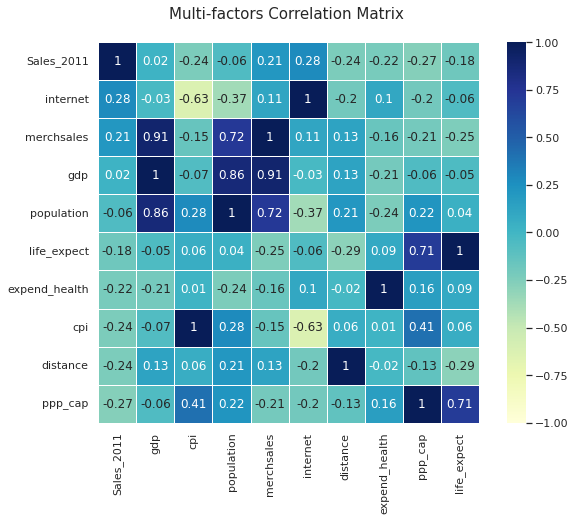

In [12]:
# plotting correlation matrices for limited
def matrix(title,size,corr,rang,square=True,annot=True):
    fig = plt.figure()
    fig.set_size_inches(size[0], size[1])

    ax1 = plt.subplot()
    ax1 = sns.heatmap(corr,vmin=rang[0], vmax=rang[1], cmap="YlGnBu"
    ,center=(rang[0]+rang[1])/2,square=square,annot=annot,linewidths=.8)
    ax1.set_title(title,fontsize=15)

matrix(title="Multi-factors Correlation Matrix \n",size=(10,7),corr=corr,rang=(-1,1))

# cmap="YlGnBu"
# cmap=sns.diverging_palette(20, 220, n=25)

In [13]:
# Plot colored by continent for years 201
def pairplot(liste_winner):
    sns.pairplot(finaldf, 
             vars = liste_winner, 
             hue = 'region', diag_kind = 'kde', 
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4);
    # Title 
    plt.suptitle('Pair Plot of Socioeconomic Data for 2011',size = 28);


## Folium map data preparation 

In [20]:
# Now let's build an interactive map - with a menu of all the indicators.
# These indicators have different measures, so we will standardize them in order to have consistency in the visualization
# Merged_df_norm is our final, normalized dataset
# FOLIUM map code reference: Frederic Gigou SIADS 521 assignment 3

# preparing the data_set
merged_df3=finaldf.copy()
merged_df3.set_index("code",inplace=True)
df3=merged_df3[liste_full]
merged_df_norm = df3.apply(lambda x: (x - np.nanmean(x)) / np.nanstd(x))
df3.reset_index(inplace=True)
df3["Country"]=df3["code"].apply(lambda val:valeurs(val,value=False))
df1=df3
# renaming columns for map visualization
df1.columns=["code","2011 Sales $","GDP","CPI","Population", "Imports", "Internet penetration", "Distance", "Expenditure on Health", "PPP per Capita", "Life Expectancy", "Country"]

/tmp/ipykernel_394/1405646261.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3["Country"]=df3["code"].apply(lambda val:valeurs(val,value=False))


In [17]:
# let's set a new folium map with a high-level zoom

new_map = folium.Map(location=[0, 0], zoom_start=1.5)

# Now we need to create feature groups with their corresponding data frames in order to draw the indicators on the map

data_frames=[]
liste_feat_groups=[]
liste_map=["2011 Sales $","GDP","CPI","Population", "Imports", "Internet penetration", "Distance", "Expenditure on Health", "PPP per Capita", "Life Expectancy"]

j=0
for element in liste_map:
    df="{}".format(element)
    df=df1[["Country","code",element]]
    data_frames.append(df)   
    feat_group="feature_group{}".format(j)
    feat_group = folium.FeatureGroup(name=element,overlay=False).add_to(new_map)
    liste_feat_groups.append(feat_group)
    j+=1

In [18]:
# let's incorporate  the  feature groups within the Choropeth object that's part of the map.
for i in range(len(data_frames)):
    
    choropleth = folium.Choropleth(
    geo_data=world_geo,
    name='choropleth',
    data=data_frames[i],
    columns=['code',liste_map[i]],
    key_on='feature.id',                     
    fill_color='YlGnBu',
    nan_fill_color="white",
    fill_opacity=0.7,
    line_opacity=0.2,
    highlight=True,
    legend_name=liste_full[i],   
    line_color='black').geojson.add_to(liste_feat_groups[i])
    
    # Let's add the country labels that are activated when the mouse
    geojson1 = folium.GeoJson(data=world_geo,style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5}, tooltip=folium.GeoJsonTooltip(fields=['name'],labels=False)).add_to(choropleth)

# Let's add a legend to the map   
colormap = cm.linear.YlGnBu_09.scale(-3,3)
colormap = colormap.to_step(10)
colormap.caption = "Data is standardized"
colormap.add_to(new_map)

# Let's display the menu
folium.LayerControl(collapsed=False).add_to(new_map)


## Folium map visualization

In [19]:
# finally, let's draw the map, We are done!
new_map    

# You can now navigate on each country to see their country name and also use the menu on the right.

# Fitting regression model sales ~ macro data

## Finding optimal model based on adjusted R2

In [ ]:
# Fitting the macro model

def macro_model(liste_factores,finaldf):
    dico={}
    r=0
    winner=[]

    for i in range(1,len(liste_factores)):
        # Creating an itertool object with all combinations of factors
        liste=(itertools.combinations(liste_factores,i))
        winner_liste=["Sales_2011"]
    
        for i in liste:
            # Creating a string with + to integrate factors into model
            element1=' + '.join(list(i))
            winner_liste.append(i)
        
        
            # Creating string with final parameters for linear regression
            a="Sales_2011 ~ {}".format(element1)
        
            # Running the linear regression
            model = sm.OLS.from_formula(a, data=finaldf)
            result = model.fit()
        
            # Creating a dictionary with all the combinations' adj r squared results
            dico[element1]=result.rsquared_adj.round(3)
            r1=dico[element1]
        
            # saves best adjusted r-squared and liste of columns 
            if r1>r:
                r=r1
                winner=element1

    # Build liste from winning string
    winner_liste=winner.split(" + ")
        
    # Extracting second best model
    second=sorted(dico.items(), key=lambda x: x[1],reverse=True)[:5][1][0]

    # Running the winning model
    a="Sales_2011 ~ {}".format(winner)
    model = sm.OLS.from_formula(a, data=finaldf)
    result = model.fit()

    # Returns best model according to Adjusted R-squared
    return result,winner_liste,dico

# Returns best model according to Adjusted R-squared
result,winner_liste,dico=macro_model(liste_factores,finaldf)
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Sales_2011   R-squared:                       0.383
Model:                            OLS   Adj. R-squared:                  0.288
Method:                 Least Squares   F-statistic:                     4.031
Date:                Sun, 19 Sep 2021   Prob (F-statistic):             0.0113
Time:                        19:51:19   Log-Likelihood:                -385.10
No. Observations:                  31   AIC:                             780.2
Df Residuals:                      26   BIC:                             787.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      9.214e+04   3.69e+04      2.499      0.019    1.63e+04    1.68e+05
gdp           -2.862e-08   9.51e-09     -3.008      0.006   -4.82e-08   -9.07e-09
merchsales     2.087e-07   6.38e-08      3.269      0.003    7.75e-08     3.4e-07
distance         -3.4840      1.842     -1.892      0.070      -7.270       0.302
expend_health -7384.7404   4242.725     -1.741      0.094   -1.61e+04    1336.306
==============================================================================
Omnibus:                       15.898   Durbin-Watson:                   1.860
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               17.272
Skew:                           1.511   Prob(JB):                     0.000178
Kurtosis:                       5.059   Cond. No.                     1.09e+13
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.09e+13. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Pairplots of winning model factors

/shared-libs/python3.9/py/lib/python3.9/site-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


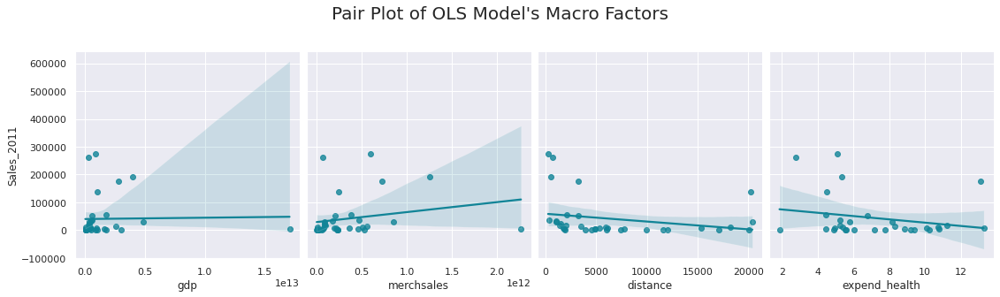

In [ ]:
# Pair plot for winner_liste of factors
def pairplot(winner_liste):
    sns.pairplot(finaldf, 
             y_vars =["Sales_2011"],
             x_vars=winner_liste, 
             # hue = 'income group',
             kind = 'reg', 
             plot_kws=dict(color="#118497"),
             # plot_kws=dict(s=80,edgecolor="white", linewidth=2.5),
             size=4);
    # color="#BF9000"
    plt.suptitle("Pair Plot of OLS Model's Macro Factors", size=20, y=1.15);

pairplot(winner_liste)

## Top 10 macro models

In [ ]:
# Returns Top 10 models according to adjusted R-squared
ordered_liste=sorted(dico.items(), key=lambda x: x[1],reverse=True)[:10]
second=ordered_liste[1][0]
ordered_liste

[('gdp + merchsales + distance + expend_health', 0.288),
 ('gdp + merchsales + internet + distance + expend_health', 0.264),
 ('gdp + merchsales + distance + expend_health + ppp_cap', 0.263),
 ('gdp + cpi + merchsales + distance + expend_health', 0.262),
 ('gdp + population + merchsales + distance + expend_health', 0.26),
 ('gdp + cpi + population + merchsales + distance + expend_health', 0.246),
 ('gdp + population + merchsales + internet + distance + expend_health',
  0.244),
 ('gdp + merchsales + distance', 0.241),
 ('gdp + population + merchsales + distance + expend_health + ppp_cap', 0.237),
 ('gdp + merchsales + internet + distance + expend_health + ppp_cap', 0.236)]

## Predictions based on winning macro model

In [ ]:
# returning sales predictions dataset based on winning model
da=finaldf.copy()

predictions=result.predict(da)
da["Pred_macro"]=predictions

# converting negative values to 0
da.loc[da["Pred_macro"]<0,"Pred_macro"]=0

# Calculating macro potential as Sales_2011 minus the prediction
da.loc[:,'Potential_macro']=da.loc[:,'Pred_macro']-da.loc[:,'Sales_2011']
df_predict=da[['name','Sales_2010','Sales_2011','Pred_macro','Potential_macro']].copy()
df_predict.set_index("name",inplace=True)

# fill na to o
df_predict=df_predict.fillna(0)
df_predict.loc[:,"Potential_macro"]=df_predict.loc[:,"Potential_macro"].fillna(0)
df_predict.loc[df_predict["Potential_macro"]<0,"Potential_macro"] =0

# sort in descending order according to potentail
df_predict.sort_values('Potential_macro',ascending=False,inplace=True)

# returns df predict as integer
df_predict=df_predict.astype(int)

# returning data frame with predictions and potential
df_predict.head()

,Sales_2010,Sales_2011,Pred_macro,Potential_macro
name,,,,
Belgium,21707,35327,134610,99282
Hong Kong,3922,9952,84477,74524
Lithuania,6553,0,48503,48503
Italy,13731,15169,62289,47120
Canada,1216,3115,47375,44260


# Fitting regression model based on sales trend

## Monthly sales visualization

In [ ]:
# Preparing dataset with sales by month
msales_df=msales_df.astype(int)
msales_df["sum"]=msales_df.sum(axis=1)
msales_df.sort_values("sum",ascending=False,inplace=True)
msales_df.drop('sum',axis='columns', inplace=True)
try:
    msales_df.drop('count',axis='columns', inplace=True)
except:
    pass


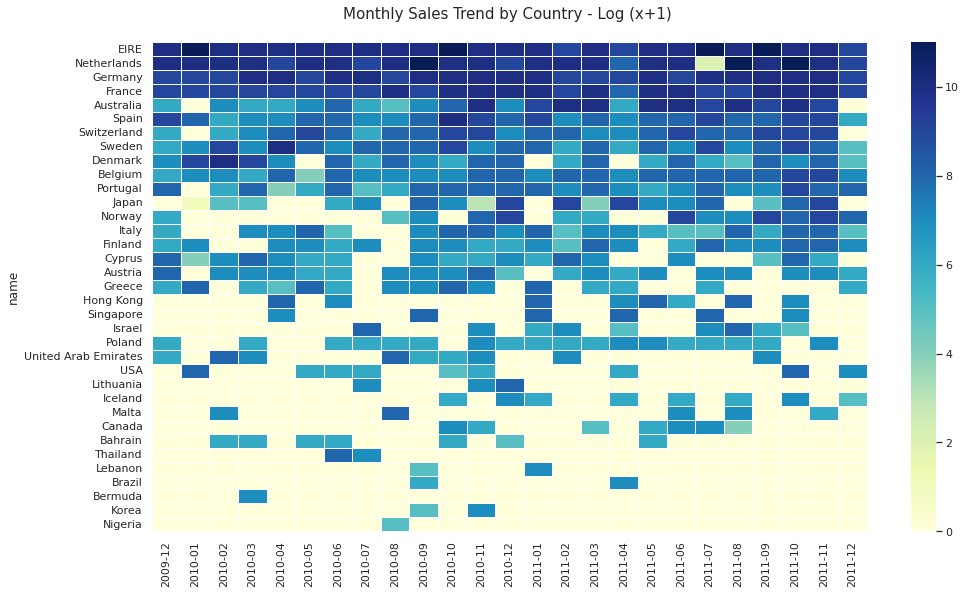

In [ ]:
# Monthly Sales visualization with heat map
# Transformation to log (x+1) as we have many 0s in the dataset
def monthly_sales_log(msales_df):
    corr2=np.log(msales_df+1).round(0)
    maxi=corr2.to_numpy().max()

    matrix(title="Monthly Sales Trend by Country - Log (x+1) \n",size=(16,9),corr=corr2,rang=(0,maxi),
    square=False,annot=False)
monthly_sales_log(msales_df)

In [ ]:
## add a count of existing sales value, will only make predictions on rows with at least 12 values.
msales_df['count'] = msales_df[msales_df > 0].count(axis=1)

# set the threshold for accepting projections
n=20

table_short=msales_df[msales_df['count']>=n].copy()
table_short.drop('count',axis='columns', inplace=True)

# convert negative values to zero
table_short[table_short < 0] = 0
table_short=table_short.astype(int)
liste_short=table_short.index
liste_short
n_country=len(table_short)
n_country


14

In [ ]:
### add a total for 14 key exports market to fit the model and run visualization.
table_short.loc['Total',:]= table_short.sum(axis=0)

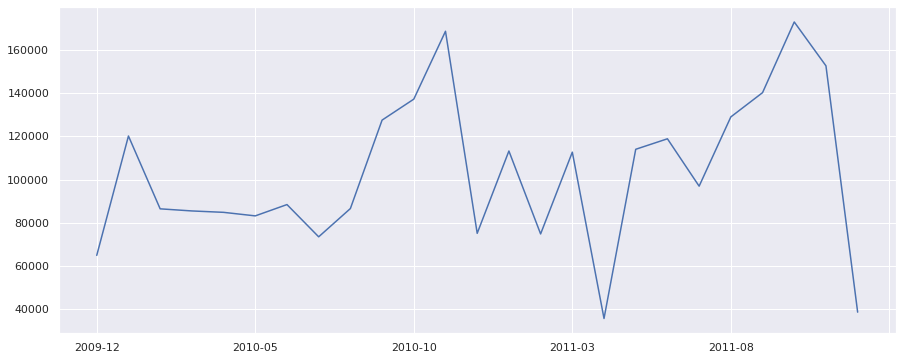

In [ ]:
#Total sum per column: 

def plot_1(y):
    y.plot(figsize=(15, 6))
    plt.show()

y=table_short.loc['Total',:]
plot_1(y)

## 2012 Sales Linear regression monthly prediction function

In [ ]:
## run linear prediction for 2012 for 14 countries with at least 20 readings)
def regression(row):
    my_x=list(range(1,len(row)+1))
    my_y=row
    b1, b0, r_value, p_value, std_err = scipy.stats.linregress(my_x, my_y)

    y_hat=[]
    for x in range (26,38):
        y_hat.append(b0 + b1 * x)
    
    return y_hat


table_short["month"]=table_short.apply(lambda row: regression(row.tolist()),axis=1)
table = pd.DataFrame([pd.Series(x).astype(int) for x in table_short.month],index=table_short.index)
table.columns=yr2012
table_short.drop('month',axis='columns', inplace=True)
table["Pred_regr"]=table.sum(axis=1).astype(int)
table[table < 0] = 0
table_short=pd.merge(table_short.reset_index(), table.reset_index(), how='left',left_on='name', right_on='name')

# Returning monthly sales projection
table_short.set_index('name',inplace=True)

In [ ]:
# shows first 5 rows of monthly sales data including 2012 projections based on regression model.
table_short.head()

,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,...,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,Pred_regr
name,,,,,,,,,,,,,,,,,,,,,
EIRE,18946.0,58669.0,20415.0,21778.0,23357.0,18652.0,22449.0,34595.0,25405.0,35898.0,...,20183,19872,19561,19250,18939,18628,18318,18007,17696,232866
Netherlands,15045.0,29167.0,17210.0,24241.0,6336.0,22221.0,24134.0,5385.0,24881.0,44773.0,...,25364,25575,25785,25996,26206,26417,26627,26838,27048,310686
Germany,9034.0,11260.0,7971.0,15347.0,21667.0,8100.0,14383.0,18227.0,8982.0,16192.0,...,19563,19813,20064,20315,20565,20816,21067,21317,21568,242272
France,5873.0,7316.0,8073.0,8027.0,7144.0,13344.0,8439.0,7276.0,16285.0,12314.0,...,19698,20137,20576,21015,21454,21893,22331,22770,23209,249546
Australia,271.0,0.0,1029.0,429.0,630.0,1312.0,3214.0,631.0,176.0,785.0,...,15865,16435,17006,17576,18147,18717,19287,19858,20428,207492


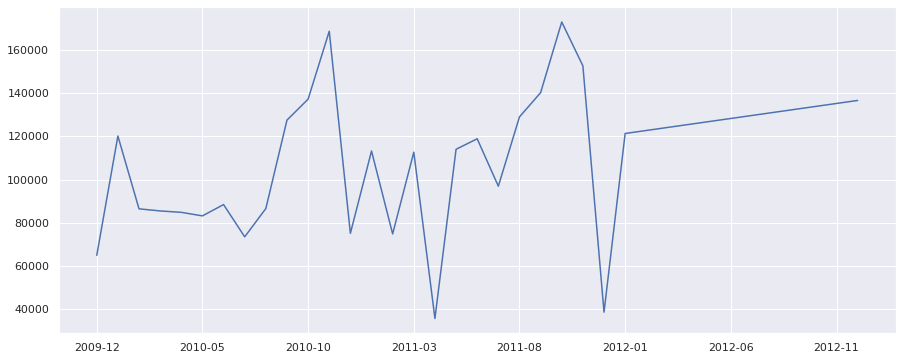

In [ ]:
## visualizing sales projections for sum of 14 countries
y1=table_short.loc['Total'].iloc[:-1]
plot_1(y1)

## 2012 Sarima regression optimization

In [ ]:
# Sarima function - not run for data efficiency reason, winner_sarimax=[1, 1, 0, 0, 1, 0, 12]
# Not seasonal but autoregressive (dependent on last value)
# p (AR) autorigressive, autocorrelation function (ACF) spikes decays to zero.
# q (MA) moving average, partial autocorrelation function (PACF) spikes decays to zero
# d (I) 1 means non stationary model
# SARIMAX= ARIMA with Seasonality and X exogeneous factors
# SARIMA= SARIMA without X (exog)

##  Auto_arima code snipet reference: Towards Data Science Time Series predictions using Arima & Sarimax Sailaja Karra Oct 20, 2020·

Sarimax_model = auto_arima(y,
                       start_P=1,
                       start_q=1,
                       max_p=3,
                       max_q=3,
                       m=12,
                       seasonal=True,
                       d=None,
                       D=1,
                       trace=True,
                       error_action='ignore',
                       suppress_warnings=True,
                       stepwise=True)


model = SARIMAX(y,order=Sarimax_model.order,
              seasonal_order=Sarimax_model.seasonal_order,
              enforce_stationarity=False,
              enforce_invertibility=False)
results = model.fit()
results.summary()


Performing stepwise search to minimize aic
 ARIMA(2,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=306.930, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=310.926, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=311.527, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=306.211, Time=0.02 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=308.874, Time=0.04 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=308.862, Time=0.06 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=308.969, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=309.563, Time=0.03 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=311.338, Time=0.16 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 1.454 seconds
/root/venv/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                 
================================================================================
Dep. Variable:                    Total   No. Observations:                   25
Model:             SARIMAX(0, 1, 0, 12)   Log Likelihood                -140.921
Date:                  Sun, 19 Sep 2021   AIC                            283.843
Time:                          20:05:16   BIC                            284.327
Sample:                      12-01-2009   HQIC                           283.663
                           - 12-01-2011                                         
Covariance Type:                    opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      6.531e+08   3.35e+08      1.950      0.051   -3.48e+06    1.31e+09
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 1.16
Prob(Q):                              0.89   Prob(JB):                         0.56
Heteroskedasticity (H):               0.91   Skew:                            -0.59
Prob(H) (two-sided):                  0.93   Kurtosis:                         2.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
print("Winning Sarima model is p,d,q {} and P,D,Q, months {}".format(Sarimax_model.order,Sarimax_model.seasonal_order))

Winning Sarima model is p,d,q (0, 0, 0) and P,D,Q, months (0, 1, 0, 12)


## Sales prediction visualization

In [ ]:
element1=", ".join(['2010-01', '2010-02', '2010-03', '2010-04', '2010-05',
          '2010-06', '2010-07', '2010-08', '2010-09', '2010-10', '2010-11',
          '2010-12','2011-01', '2011-02', '2011-03', '2011-04', '2011-05',
          '2011-06', '2011-07', '2011-08', '2011-09', '2011-10', '2011-11',
          '2011-12'])

### Sarima model data prep

In [ ]:
## creating a Nan prediction data set

# Creating the full index in month / date format
history_index=['2009-12','2010-01', '2010-02', '2010-03', '2010-04', '2010-05',
          '2010-06', '2010-07', '2010-08', '2010-09', '2010-10', '2010-11',
          '2010-12','2011-01', '2011-02', '2011-03', '2011-04', '2011-05',
          '2011-06', '2011-07', '2011-08', '2011-09', '2011-10', '2011-11',
          '2011-12']

# creating the correct prediction index in month/date format
predict_index=['2011-12','2012-01', '2012-02', '2012-03', '2012-04', '2012-05',
          '2012-06', '2012-07', '2012-08', '2012-09', '2012-10', '2012-11',
          '2012-12']

predict_index2=['2010-12','2011-01', '2011-02', '2011-03', '2011-04', '2011-05',
          '2011-06', '2011-07', '2011-08', '2011-09', '2011-10', '2011-11',
          '2011-12','2012-01', '2012-02', '2012-03', '2012-04', '2012-05',
          '2012-06', '2012-07', '2012-08', '2012-09', '2012-10', '2012-11',
          '2012-12']


full_index=['2009-12','2010-01', '2010-02', '2010-03', '2010-04', '2010-05',
          '2010-06', '2010-07', '2010-08', '2010-09', '2010-10', '2010-11',
          '2010-12','2011-01', '2011-02', '2011-03', '2011-04', '2011-05',
          '2011-06', '2011-07', '2011-08', '2011-09', '2011-10', '2011-11',
          '2011-12','2012-01', '2012-02', '2012-03', '2012-04', '2012-05',
          '2012-06', '2012-07', '2012-08', '2012-09', '2012-10', '2012-11',
          '2012-12']


def prediction_df(y,results):
    Sarimax_pred=pd.DataFrame(index=full_index,columns=["Sales"])

    Sarimax_pred["Sales"]=y
    pred= results.predict('2010-12','2012-12', dynamic= True)
    pred.index=predict_index2

    Sarimax_pred=pd.merge(Sarimax_pred, pred, how='left',left_index=True, right_index=True)

    ## extracting the confidence intervals
    pred = results.get_prediction('2010-12','2012-12', dynamic=False)
    pred_ci = pred.conf_int()
    pred_ci.index=predict_index2
    Sarimax_pred=pd.merge(Sarimax_pred, pred_ci, how='left',left_index=True, right_index=True)
    return Sarimax_pred

Sarimax_pred=prediction_df(y,results)

### Sarima visualization

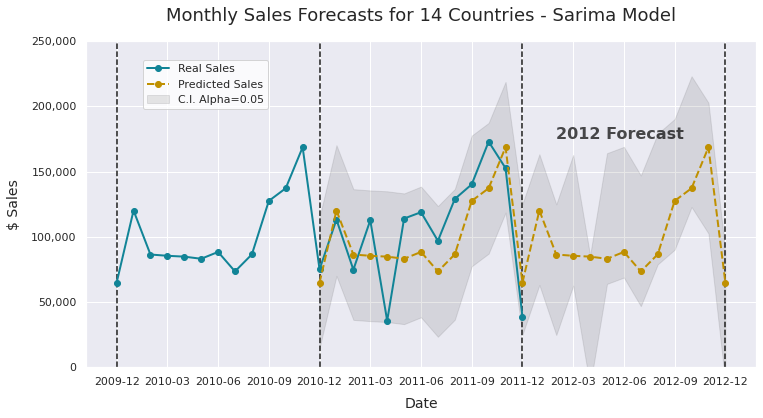

In [ ]:
# Visualization function of model
def chart_predict(Sarimax_pred,name="Sarimax",ymin=0,ymax=250000):
    
    fig, ax=plt.subplots()
    fig.set_size_inches(12, 6) 
        
    # plotting both lines  
    ax.plot(Sarimax_pred['Sales'].index, Sarimax_pred['Sales'].values,linewidth=2, markersize=6,marker='o', color="#118497", label="Real Sales")
    ax.plot(Sarimax_pred["predicted_mean"].index, Sarimax_pred["predicted_mean"].values, linestyle='dashed',color="#BF9000",linewidth=2, markersize=6,marker='o', label="Predicted Sales")

    ## plotting the CI
    ax.fill_between(Sarimax_pred.index,Sarimax_pred['lower Total'],Sarimax_pred['upper Total'], color='k', alpha=.1,label="C.I. Alpha=0.05")
        
    ax.set_xlabel('Date',labelpad=10,size=14)
    ax.set_ylabel('$ Sales',labelpad=10,size=14 )
    ax.set_ylim(ymin, ymax)

    ax.set_title("Monthly Sales Forecasts for {} Countries - {} Model".format(n_country,name),fontsize=18,pad=20)

    ## draw year vertical lines
    # ymin=0
    ax.vlines('2009-12', ymin, ymax, colors='k', linestyles='--')
    ax.vlines('2010-12', ymin, ymax, colors='k', linestyles='--')
    ax.vlines('2011-12', ymin, ymax, colors='k', linestyles='--')
    ax.vlines('2012-12', ymin, ymax, colors='k', linestyles='--')
    ax.legend(bbox_to_anchor=(0.28,0.96),facecolor="white")

    # convert y axis to thousand separator
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

    # x axis= only 1/3 of labels
    plt.gca().xaxis.set_major_locator(plt.MultipleLocator(3))

    # make annotation
    ax.annotate("2012 Forecast", xy=(Sarimax_pred['Sales'].index[26], 175000),size=16,weight='bold',color="black",alpha=0.7)


    plt.show()
chart_predict.n_country=n_country
chart_predict(Sarimax_pred,name="Sarima")


### OLS model data prep

In [ ]:
def prediction_df_OLS(y):
    OLS_pred=pd.DataFrame(index=history_index,columns=["Sales"])
    OLS_2=pd.DataFrame(index=full_index,columns=["Sales"])
    OLS_pred["Sales"]=y
    OLS_pred["x"]=range(1,len(OLS_pred)+1)
    OLS_2["Sales"]=y
    OLS_2["x"]=range(1,len(OLS_2)+1)
       
    model = sm.OLS.from_formula("Sales ~ x", data=OLS_pred)
    result = model.fit()
    # OLS_pred=pd.merge(OLS_2, OLS_pred,how='left',left_index=True, right_index=True)
    
    pred = result.get_prediction(OLS_2)
 

    predict_frame=pred.summary_frame(alpha=0.05)[["mean","mean_ci_lower","mean_ci_upper"]].astype(int)
    predict_frame.index=full_index
    predict_frame.columns=(["predicted_mean","lower Total","upper Total"])

    OLS_2=pd.merge(OLS_2, predict_frame,how='left',left_index=True, right_index=True)
    OLS_2.drop(["x"], axis=1,inplace=True)

    return result, OLS_2

result, OLS_2=prediction_df_OLS(y)
result.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.082
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                     2.044
Date:                Sun, 19 Sep 2021   Prob (F-statistic):              0.166
Time:                        20:09:16   Log-Likelihood:                -296.05
No. Observations:                  25   AIC:                             596.1
Df Residuals:                      23   BIC:                             598.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    8.52e+04   1.45e+04      5.895      0.000    5.53e+04    1.15e+05
x           1389.7723    972.153      1.430      0.166    -621.280    3400.824
==============================================================================
Omnibus:                        1.979   Durbin-Watson:                   1.728
Prob(Omnibus):                  0.372   Jarque-Bera (JB):                0.842
Skew:                          -0.396   Prob(JB):                        0.656
Kurtosis:                       3.427   Cond. No.                         30.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### OLS visualization - 14 countries

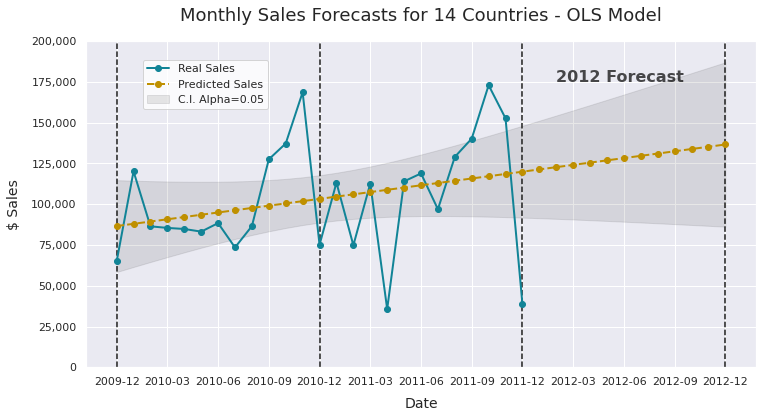

In [ ]:
chart_predict(OLS_2,name="OLS", ymin=0,ymax=200000)

### Comparative RMSE, Sarima vs OLS

In [ ]:
df2=pd.concat([OLS_2,Sarimax_pred],axis=1)
df2.to_excel("forecasts.xlsx")

In [ ]:
## Calculates RMSE for both models
def RMSE(df):
    error=mean_squared_error(df.Sales, df.predicted_mean)
    RMSE=int(np.sqrt(error))
    return RMSE

print("Sarima RMSE: {}".format(RMSE(Sarimax_pred.iloc[12:25,:2])))
print("OLS RMSE: {}".format(RMSE(OLS_2.iloc[:25,:2])))

Sarima RMSE: 27814
OLS RMSE: 33620


# Where to Play : Country Ranking

## Data preparation: country ranking

In [ ]:
## returning a summary table with Sales history, prediction and potential for all countries.
merged_potential=pd.merge(df_predict.reset_index(), table_short['Pred_regr'].reset_index(), how='left',left_on='name', right_on='name')
merged_potential.round(0)
merged_potential["Potential_regr"]=merged_potential['Pred_regr']-merged_potential["Sales_2011"]
# merged_potential=merged_potential[[]]
merged_potential=merged_potential.fillna(0)
merged_potential.set_index("name",inplace=True)
merged_potential[merged_potential < 0] = 0
merged_potential=merged_potential.astype(int)
liste_top_n=merged_potential.sort_values("Potential_regr",ascending=False).head(5).index
liste_top_n
cols=['2010 Sales', '2011 Sales', 'Macro Reg', 'Macro Reg_pot','2012 Reg','2012 Reg_pot']
merged_potential.columns=cols


In [ ]:
## data preparation function, will rank the data, filter top N countries and return a melted df for Altair visualization
top=5
pd.options.mode.chained_assignment = None  

## return data set and country rank for visualization depending on order parameter
def data_prep_vis(merged_potential,order='2012 Reg_pot',TOP=5):
    merged_potential.sort_values(order,ascending=False,inplace=True)
      
    # filters top_n countries for visualizaiton 
    merged_potential=merged_potential.head(TOP)
    key_markets=merged_potential.index

    # Create a label with rank number and country name
    merged_potential["Rank"] = merged_potential[order].rank(ascending=False)
    merged_potential.reset_index(inplace=True)
    merged_potential.rename(columns = {'name': 'market'},inplace=True)
    def f(a,b):
        return (str(int(a))+"- "+str(b))
    
    merged_potential["Country"]=merged_potential.apply(lambda x:f(x.Rank, x.market), axis=1)

    # Removes non necessary rows for visualization
    merged_potential.drop(['Rank','market'],axis='columns', inplace=True)

    merged_potential.reset_index(inplace=True)
    
    # Melts data frame for Altair visualization formating. Rename columns and format labels
    df_melted = pd.melt(merged_potential, id_vars=["Country"], value_vars=cols)
    df_melted.columns=["Country","Year","$ Sales"]
    merged_potential.drop('index',axis='columns', inplace=True)
    liste_country=df_melted.Country.unique()
    df_melted["label"]=df_melted["$ Sales"].apply(lambda x: str(int(x/1000))+" K")
    
    return key_markets,df_melted,liste_country

data_prep_vis.cols=cols


In [ ]:
# returning data set first 5 rows for rendering 
key_markets,df_melted,liste_country=(data_prep_vis(merged_potential,order='2012 Reg_pot',TOP=top))
df_melted.head()

,Country,Year,$ Sales,label
0,1- France,2010 Sales,135022,135 K
1,2- Australia,2010 Sales,31075,31 K
2,3- Germany,2010 Sales,187504,187 K
3,4- Netherlands,2010 Sales,259772,259 K
4,5- Switzerland,2010 Sales,41937,41 K


In [ ]:
# Visualization function of sales potential

def bar(country,ax):

    # Filters column from for loop
    df=df_melted[df_melted["Country"]==country]
    
    # determines a specific color hex code for each label
    color_scale = alt.Scale(domain=['2010 Sales', '2011 Sales','2012 Reg','2012 Reg_pot','Macro Reg', 'Macro Reg_pot'],
                        range=["#E7BC29","#BF9000","#118497","#118497","#809EC2","#809EC2"])

    # Returns first horizontal chart with y axis label
    if ax:
        chart=alt.Chart(df).mark_bar(size=20,fontSize=16).encode(
            x=alt.X('$ Sales:Q',title=country,scale=alt.Scale(domain=[0,450000]),axis=None),
            y=alt.Y('Year:N',axis=alt.Axis(labelFontSize=16,labelPadding=15,title=None,grid=False)),
            color=alt.Color('Year:N'))

    # returns charts 2 to 5 without y label
    else:
        chart=alt.Chart(df).mark_bar(size=20,fontSize=16).encode(
            x=alt.X('$ Sales:Q',title=country,scale=alt.Scale(domain=[0,450000]),axis=None),
            y=alt.Y('Year:N',title=None,axis=None),            
            color=alt.Color('Year:N',scale=color_scale,legend=None)) #, scale=color_scale,legend=None)

    # Add text lable
    text = alt.Chart(df).mark_text(size=12,dx=25,dy=0,fontWeight=200).encode(y=alt.Y('Year:N'),x=alt.X('$ Sales:Q'),
                                                                             text=alt.Text('label:N'))
    
    return text + chart

# format final chart with size / strokeWidth and padding (meaning bar space) and add title
def configuration(chart,title,subtitle):
    chart_final = chart.configure_mark().properties(
        title=alt.TitleParams(text=title,fontSize=20)).configure_view(
        strokeWidth=0).configure_scale(
        bandPaddingInner=0.2)
    return chart_final

# assign df_melted to function
bar.df_melted=df_melted
  


## Economic potential visualization based on sales regression

In [ ]:
# Loop through all countries to render the layered chart with 5 countries overall.

ax=True
for country in liste_country:
    if ax:
        plot1=bar(country,ax).properties(
            width=90,height=130,title=alt.TitleParams(text=country,fontSize=14,dy=-5))
    else:
        plot1=plot1 | bar(country,ax).properties(
            width=90,height=130,title=alt.TitleParams(text=country,fontSize=14,dy=-5))
    ax=False

# rendering was disabled due to Altair bug in deepnote. Code renders in 
plot1.properties(title=alt.TitleParams(text="Figure 5: Economic Net Potential Summary",fontSize=18,dy=-5))   

alt.HConcatChart(...)

## 

## Visualization of  Macro potential

In [ ]:
# preparing dataset with macro potential
liste_potential,df_melted,liste_country=(data_prep_vis(merged_potential,order='Macro Reg_pot',TOP=top))
print(liste_country)
print(df_melted.head())

['1- Belgium' '2- Hong Kong' '3- Lithuania' '4- Italy' '5- Canada']
        Country        Year  $ Sales label
0    1- Belgium  2010 Sales    21707  21 K
1  2- Hong Kong  2010 Sales     3922   3 K
2  3- Lithuania  2010 Sales     6553   6 K
3      4- Italy  2010 Sales    13731  13 K
4     5- Canada  2010 Sales     1216   1 K


In [ ]:
# Renders chart with top 5 countries with macro potential

ax=True
for country in liste_country:
    if ax:
        plot1=bar(country,ax).properties(width=90,height=130,title=alt.TitleParams(text=country,fontSize=14,dy=-5))
    else:
        plot1=plot1 | bar(country,ax).properties(width=90,height=130,title=alt.TitleParams(text=country,fontSize=14,dy=-5))
    ax=False

plot1.properties(title=alt.TitleParams(text="Economic Net Potential Summary",fontSize=18,dy=-5))



alt.HConcatChart(...)

## Bubble chart visualization of key and potential markets

In [ ]:
## preparing source data set to visualize key and potential markets in a bubble chart

def type_country(x):
    if x in liste_top_n:
        x="Key markets"
    elif x in liste_potential:
        x="Potential markets"
    else:
        x="Other"
    return x

# Establishing groups for "color" hue and only keep key and potential markets
source=merged_potential.copy()
source.reset_index(inplace=True)
source["Type"]=source["name"].apply(lambda x: type_country(x))
source=source[source["Type"]!="Other"]

In [ ]:
# Preparing  labels to avoid visualization overlap
source["name"].replace({"Lithuania":"Lithuania         -","Canada":"-                   Canada"},inplace=True)

In [ ]:
# Bubble chart visualization. Features both macro and linear regression countries
sales = alt.Chart(source).mark_circle().encode(
    x=alt.X('2012 Reg:Q', title="2012 linear regression", scale=alt.Scale(domain=[-1000,340000])),
    y=alt.Y('Macro Reg:Q', title="Macro regression", scale=alt.Scale(domain=[0,250000])),
    size=alt.Size('2011 Sales:Q', scale=alt.Scale(domain=[0,30000]),
    legend=alt.Legend(values=[50000,100000,250000])),
    color=alt.Color("Type")
).properties(width=300, height=280)

text = alt.Chart(source).mark_text(size=11,dx=0,dy=0,fontWeight=200,color="black").encode(
    x=alt.X('2012 Reg:Q'),
    y=alt.Y('Macro Reg:Q'),
    text=alt.Text('name:N')
).properties(width=300, height=280)

sales + text

alt.LayerChart(...)

# How to win: section on customer recommender system

## EDA and preparation

In [ ]:
# checking number of nans in transaction
clean_df.isnull().sum()

Invoice             0
StockCode           0
Description      1656
Quantity            0
InvoiceDate         0
Price               0
Customer ID    236874
Country             0
SalesValue          0
dtype: int64

In [ ]:
# clean_df2 is dataset without customer ID and descritpion nas
clean_df2=clean_df.copy()
clean_df2.dropna(inplace=True)

In [ ]:
clean_df2.describe()

,Quantity,Price,Customer ID,SalesValue
count,802693.000000,802693.000000,802693.000000,802693.000000
mean,13.336557,2.930540,15338.078239,21.719948
std,144.543831,4.275829,1693.934876,222.562934
min,1.000000,0.000000,12346.000000,0.000000
25%,2.000000,1.250000,13988.000000,4.950000
50%,5.000000,1.950000,15276.000000,11.800000
75%,12.000000,3.750000,16809.000000,19.500000
max,80995.000000,649.500000,18287.000000,168469.600000


In [ ]:
clean_df.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,SalesValue
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom,83.4
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,81.0
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,81.0
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom,100.8
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom,30.0


In [ ]:
## creating dictionnnary of codes and products - There are nas to filter out and we need to extract short description to plot word cloud
dict_products=clean_df2.set_index('StockCode').to_dict()['Description']


In [ ]:
## return count of Customers and StockCode by country
dfgroup=clean_df2.groupby(["Country"]).agg({"Customer ID":pd.Series.nunique,"StockCode":pd.Series.nunique}).astype(int)
dfgroup.sort_values(by="Customer ID", ascending=False,inplace=True)
dfgroup.head(6)

,Customer ID,StockCode
Country,,
United Kingdom,5335,4604
Germany,107,2168
France,93,1999
Spain,38,1406
Belgium,29,987
Portugal,23,904


In [ ]:
dfgroup_vis=dfgroup.head(6).copy()
colum=dfgroup_vis.columns
dfgroup_vis.reset_index(inplace=True)

In [ ]:
## remove  index rows from index # this should go away with the right connections.
##  4 countries need to be removed
df_group2=clean_df2.groupby(["Country","Customer ID"]).agg({"StockCode":pd.Series.nunique})
df_group2=df_group2.drop(["United Kingdom","Unspecified","Channel Islands","West Indies","RSA","European Community"])

## Similarity matrix with SVD technique (Truncated matrix)

In [ ]:
# Returning a pivot table to get matrix m= stockCode (stock codes) and n= Customer ID (columns including UK)
df_customers=clean_df2.groupby(["Customer ID","StockCode"]).agg({"SalesValue":"sum"})
table_pivot = pd.pivot_table(df_customers, values='SalesValue', index=["StockCode"],columns=["Customer ID"],fill_value=0)
table_pivot.head()

Customer ID,12346.0,12347.0,12348.0,12349.0,12350.0,12351.0,12352.0,12353.0,12354.0,12355.0,...,18278.0,18279.0,18280.0,18281.0,18282.0,18283.0,18284.0,18285.0,18286.0,18287.0
StockCode,,,,,,,,,,,,,,,,,,,,,
10002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10080,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10120,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10123C,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
table_pivot.shape

(4619, 5853)

In [ ]:
# returning truncated matrix with m skus with k truncated customers. 
# Using SVD singular value decomposition by reducing from 5853 columns=> 200

X=table_pivot
# set the dimension reduction from n customers to k type of customers. 532
k=200
svd=TruncatedSVD(n_components=k,random_state=0)
svd.fit(X)
X_trunc=svd.fit_transform(X)
X_trunc

array([[ 1.78562451e-06,  1.54050084e+00,  6.68518671e+01, ...,
        -4.87170006e+01, -1.84004017e+01, -3.48023109e+01],
       [ 1.31219611e-09,  1.22669409e-03,  3.71790077e-02, ...,
         9.92407783e-01, -9.58505671e-01, -3.74092357e-01],
       [ 6.52065863e-10,  2.04705384e-04,  1.45229889e-03, ...,
        -2.16811366e-02,  5.98638124e-03, -1.59331944e-02],
       ...,
       [ 2.12666437e-11,  1.26040113e-04,  3.96841260e-03, ...,
        -5.93934674e-02,  5.96660815e-02, -6.23175563e-03],
       [ 5.25066982e-11,  3.21177530e-04,  1.27504181e-02, ...,
        -6.27881476e-02, -2.28696227e-01, -3.61969736e-01],
       [ 2.15269963e-09,  1.91030433e-03,  2.22511046e-02, ...,
        -1.34813172e-01, -1.86140342e-02, -2.09605734e-01]])

In [ ]:
# returns size of truncated matrix
print(X_trunc.shape)

(4619, 200)


In [ ]:
# optional
# Calculating Sigma (midle component with singular values in diag, meaning the strength of the concept of group)
# k x k matrix - indicates the strength of the pattern (singular value)
# singular_values=svd.singular_values_
# Sigma_diag = np.diag(singular_values)
# Sigma_diag.round(1)

## Running similarity cosine algorithm

In [ ]:
# set data frames for similarity function
# set X_truncated matrix for similarity function
# set top_n to 5 meaning top 5 product recommendation
top_n=5


# Calculating similarity based on cosine similarity n each row vs the truncated matrix
def cosine_similarity(vec_x, vec_y):
    return (vec_x@vec_y)/(np.linalg.norm(vec_x) * np.linalg.norm(vec_y))

def similarity_fun(row_customer,top_n):
    
    # convert to array the row corresponding to customers sales
    arr1=np.array(X[row_customer])
    
    # calculate similarity of customer array vs truncated matrix 
    similarity=np.array(df.apply(lambda row: cosine_similarity(arr1,row),axis=0))
    
    # returns index of array of maximum index
    ix_cos=np.argmax(similarity)
    
    # returns maximum similarity vs truncated matrix
    max_sim=similarity.max()
    
    # returns recommendation vs truncated matrix # Will return only missing items in reco["cosine"]
    reco_cosine=(X_trunc[:,ix_cos]-arr1).round(1).clip(min=0)
    
    reco=pd.DataFrame(reco_cosine,columns=["RECO Cosine"],index=X.index)
    # reco["RECO Cosine"]=reco_cosine
    reco["Current"]=arr1
    reco["Benchmark"]=X_trunc[:,ix_cos]

    # filter out rows if current sales >0reco["Current"]=0
    reco=reco[reco["Current"]==0]

    # ranks in descending order the recommendation
    reco=reco.sort_values(by=["RECO Cosine"],ascending=False)
    
    # return top_n product recommendation
    top=reco.iloc[:top_n,]
    reco=list(top.index)
    return reco

similarity_fun.X_trunc=X_trunc
#convert X_trunc to df
df=pd.DataFrame(X_trunc)
similarity_fun.df=df

# df_group2 is a group by object with multi_level index country + customer ID
df_group1=df_group2.reset_index()

# returns product recommendation by country / customer pairs. Reco is returned as a list of products
df_group1["reco"]=df_group1["Customer ID"].apply(lambda x:similarity_fun(x,top_n))
df_group1.head(5)


,Country,Customer ID,StockCode,reco
0,Australia,12386.0,10,"[35001W, 22656, 85099C, 22113, 20747]"
1,Australia,12387.0,9,"[79341, 22427, 84978, 22791, 82582]"
2,Australia,12388.0,83,"[21915, 20914, 84078A, 21843, 21166]"
3,Australia,12389.0,41,"[72741, 23084, 37449, 15036, 20914]"
4,Australia,12392.0,7,"[22656, 84755, 79341, 22625, 21136]"


In [ ]:
## regroup_by table with the recomendation list in reco columns
df_group1.set_index(["Country", "Customer ID"],inplace=True)
df_group1=df_group1[["reco"]]
df_group1.head(2)

reco
Country   Customer ID                                       
Australia 12386.0      [35001W, 22656, 85099C, 22113, 20747]
          12387.0        [79341, 22427, 84978, 22791, 82582]

In [ ]:
## returning number of customer IDs by country
total_rank=df_group1.reset_index().groupby("Country").agg({"Customer ID":"size"}).sort_values("Customer ID",ascending=False)
print(len(total_rank))
print(total_rank["Customer ID"].sum())


35
507


## Returning Top 5 countries with recommended product by customers

In [ ]:
## builds final recommendation matrix for top n products for each country by expanding the matrix
# converts list of reco to a data frame with the lambda pd.series function
final=df_group1["reco"].apply(lambda x:pd.Series(x))
#rename columns
final.columns=["Product "+str(i) for i in range(1,top_n+1)]
final.head(5)

Product 1 Product 2 Product 3 Product 4 Product 5
Country   Customer ID                                                  
Australia 12386.0        35001W     22656    85099C     22113     20747
          12387.0         79341     22427     84978     22791     82582
          12388.0         21915     20914    84078A     21843     21166
          12389.0         72741     23084     37449     15036     20914
          12392.0         22656     84755     79341     22625     21136

In [ ]:
 # function that returns the item description according to key, product code
def key(x,short=False):
    try:
        # convert key to int and returns
        x=dict_products[str(x)]
        if short:
            x=' '.join(x.split()[:3]).lower()

        return x
    except:

        return "na"

In [ ]:
# Validating the list of top n countries based on regression potential
liste_top_n

Index(['France', 'Australia', 'Germany', 'Netherlands', 'Switzerland'], dtype='object', name='name')

In [ ]:
## return top n recommendations (missing items) for ranked markets according to potential
n=5
# filter only top countries
final=final.loc[liste_top_n]

# extract the first line for each country with product recommendation (for visualizati
groupby_vis=final.reset_index().groupby("Country").first().reset_index()
groupby_vis.set_index(["Country","Customer ID"],inplace=True)

# Returning group vis for notebook - first line only of each country
for i in range(1,6):
    groupby_vis["Product {}".format(i)]=groupby_vis["Product {}".format(i)].apply(lambda x:str(x)+"\n"+key(x,short=True))
groupby_vis.reset_index(inplace=True)
groupby_vis.set_index("Country",inplace=True)

In [ ]:
# A view of the dataset with top n countries only
final

Product 1 Product 2 Product 3 Product 4 Product 5
Country     Customer ID                                                  
France      12413.0        85123A     84879     22197     22629     22630
            12437.0        85123A    85099B     84879     84347     22386
            12441.0         21915     22197    47590B    47590A     84077
            12488.0         20726     20727     20728    85123A     20713
            12489.0         51008    75049L     84568     85066     22411
...                           ...       ...       ...       ...       ...
Switzerland 13492.0         21623     82484     22189     22188    48173C
            13493.0         22113     22326     71459     22697     84836
            13501.0         22423    85099B     84879     22197     22629
            13505.0        85123A    85099B     84879     22197     22629
            13520.0         22386     84347     23084     22385     22630

[259 rows x 5 columns]

In [ ]:
# sample data set with recommendation with first line of each country / customer ID pair
groupby_vis

,Customer ID,Product 1,Product 2,Product 3,Product 4,Product 5
Country,,,,,,
Australia,12386.0,35001W\nhand open shape,22656\nvintage blue kitchen,85099C\njumbo bag baroque,22113\ngrey heart hot,20747\npiccadilly tea set
France,12413.0,85123A\ncream hanging heart,84879\nassorted colour bird,22197\npopcorn holder,22629\nspaceboy lunch box,22630\ndolly girl lunch
Germany,12426.0,22423\nregency cakestand 3,85123A\ncream hanging heart,85099B\njumbo bag red,84879\nassorted colour bird,22197\npopcorn holder
Netherlands,12759.0,85099B\njumbo bag red,84879\nassorted colour bird,84347\nrotating silver angels,23084\nrabbit night light,22328\nround snack boxes
Switzerland,12357.0,21623\nvintage union jack,82484\nwood black board,22189\ncream heart card,22188\nblack heart card,22507\nmemo board retrospot


In [ ]:
# returns top recommended products in data frame for key markets only
def top_n_product(df):
    df2=df.apply(pd.value_counts).sum(axis=1).sort_values(ascending=False).astype(int)
    df2=df2.to_frame().reset_index()
    df2.columns=["code","count"] 
    df2['description']=df2['code'].apply(lambda x: key(x))
    
    # returns top_n including ties
    df2=df2.set_index("code")[["description","count"]]
    return df2


# final df corresponds to filtered df for key markets only
key.dict_products=dict_products
df5=top_n_product(final)
df5.reset_index(inplace=True)
df5.head()

,code,description,count
0,85123A,CREAM HANGING HEART T-LIGHT HOLDER,101
1,22197,POPCORN HOLDER,93
2,84879,ASSORTED COLOUR BIRD ORNAMENT,86
3,85099B,JUMBO BAG RED RETROSPOT,67
4,84347,ROTATING SILVER ANGELS T-LIGHT HLDR,47


## Visualizing top recommended products

In [ ]:
# returns top_n considering ties for key markets ##
# function creates a short description of key words with a dictionnary for word cloud visualization

top_n=15
try:
    liste=list(df5["count"].unique())[:top_n]
except:
    liste=list(df5["count"].unique())
df5=df5[df5["count"].isin(liste)]
df5=df5.groupby(["count","description"]).agg({"code":min}).sort_values(by="count",ascending=False)
df5.reset_index(inplace=True)
df5["short_description"]=df5["description"].apply(lambda x: (' '.join(x.split()[:3]).lower()))
dict_counts=df5.set_index('short_description').to_dict()['count']

### Word cloud code and vis

In [ ]:
# visualization of top words in word cloud:

def word_cloud(dict_counts):
    wc = WordCloud(max_font_size=40, max_words=50,background_color="white",contour_color='black',contour_width=1)
    wc.generate_from_frequencies(dict_counts)
    fig, ax=plt.subplots()
    fig.set_size_inches(10, 7)  
    #fig.tight_layout() 

    plot=ax.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()



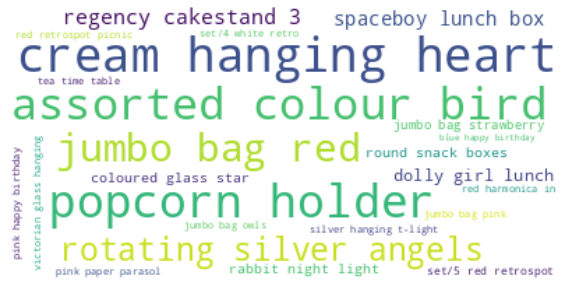

In [ ]:
word_cloud(dict_counts) 

### bar chart code and vis

In [ ]:
# Alternative visualization in Altair
words = list(dict_counts.keys())
counts = list(dict_counts.values())

def barh(df):   
    chart=alt.Chart(df).mark_bar(size=14,fontSize=16,color="#118497").encode(
            x=alt.X('Count:Q',title=country,scale=alt.Scale(domain=[0,110]),axis=None),
            y=alt.Y('Item:O',axis=alt.Axis(labelFontSize=10,
                                           labelPadding=5,
                                           title=None,
                                           grid=False),sort=words))
    text = alt.Chart(df).mark_text(size=10,dx=15,dy=0,fontWeight=200).encode(y=alt.Y('Item:O',sort=words),x=alt.X('Count:Q'),
                                                                            text=alt.Text('Count:O'))    
    return text+chart

def configuration_barh(chart,title,subtitle):
    
    chart_final = chart.configure_mark().properties(width=90,height=410,
        title=alt.TitleParams(text=title,fontSize=12,dy=-7)).configure_view(strokeWidth=0).configure_scale(bandPaddingInner=0.2)
    return chart_final


In [ ]:
df = pd.DataFrame.from_dict(dict_counts,orient='index')
df.reset_index(inplace=True)
df.columns=["Item","Count"]
configuration_barh(barh(df),title="Figure 9: Count of Top Recommended Items", subtitle=" ")

alt.LayerChart(...)

In [ ]:
# What percentage of the total counts 
sum_counts=sum(counts)
print("Top {} items sum of counts is {}, {}% of total recommended products".format(len(counts), sum_counts,int(sum_counts/(len(final)*5)*100)))

Top 24 items sum of counts is 710, 54% of total recommended products


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=023a0e03-cc30-4d6d-b448-6d27799cca93' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>